 This notebook is a guide to use segmentation_net package for segmentation.
 We will compare the performances of a simple PangNet and a more complicated one U-net applied to the task of segmenting tissue in the WSI at low resolution.
 The data is fairly scarse.

Table of Contents
======
1. [Input Data](#Input-Data)
    1. [Import and first look at the data](#Import-and-first-look-at-the-data)
    2. [Necessary data generators and tensorflow files](#Necessary-data-generators-and-tensorflow-files)
    3. [Model hyper-parameters](#Model-hyper-parameters)
2. [PangNet](#PangNet)
    1. [Train](#Train)
    2. [Validation](#Validation)
    3. [Test](#Test)
3. [U-net](#U-net)
    1. [Train u-net](#Train-u-net)
    2. [Validation u-net](#Validation-u-net)
    3. [Test u-net](#Test-u-net)
4. [U-net padded](#U-net-padded)
    1. [Train u-net padded](#Train-u-net-padded)
    2. [Validation u-net padded](#Validation-u-net-padded)
    3. [Test u-net padded](#Test-u-net-padded)
5. [U-net and batch normalization](#U-net-and-batch-normalization)
    1. [Train u-net bn](#Train-u-net-bn)
    2. [Validation bn](#Validation-u-net-bn)
    3. [Test bn](#Test-u-net-bn)
6. [Comparing the models](#Comparing-the-models)
    1. [Metric comparaison](#Metric-comparaison)
    2. [Real image comparaison](#Real-image-comparaison)

# Input Data

We will have a quick look at the data. Helper functions are provided by the HelperDemo script where we implement some fairly trivial ploting functions but also the data generators needed for building all the necessary components for the training phase. In particular, the mean of the data, the records for the training and validation.
## Import and first look at the data

Most of the functions we will use in this notebook are written in HelperDemo.py.

In [1]:
%matplotlib inline

from glob import glob
import matplotlib.pylab as plt
import seaborn as sns
sns.set(rc={'figure.figsize':(18,10)})
from numpy.random import choice
import os
import tensorflow
l2_loss = tensorflow.nn.l2_loss
import sys
sys.path.append('./src')

from HelperDemo import CheckOrCreate, plot_annotation, plot_overlay, plot_triplet
from HelperDemo import TissueGenerator, TissueGeneratorUnet, prep_val
from HelperDemo import RandomImagePick, l1_loss, unet_pred
from HelperDemo import plot_curves, plot_validation, plot_quadoverlay, recap_tab

from segmentation_net import create_tfrecord, compute_mean
from segmentation_net import SegmentationNet, Unet, UnetPadded, BatchNormedUnet

from skimage.transform import resize
from skimage import img_as_bool


import warnings
warnings.filterwarnings("ignore")

We have 19 images in the training set.
We have 7 images in the test set.


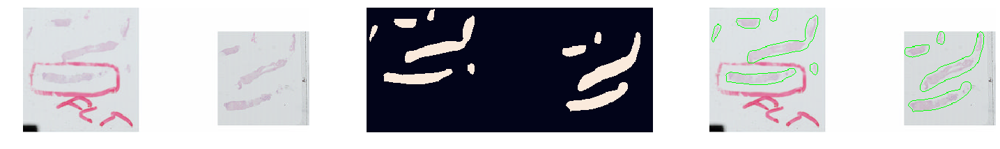

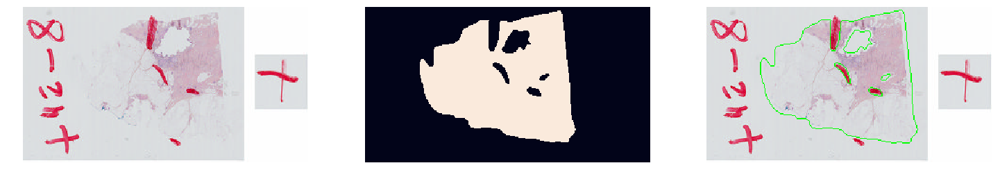

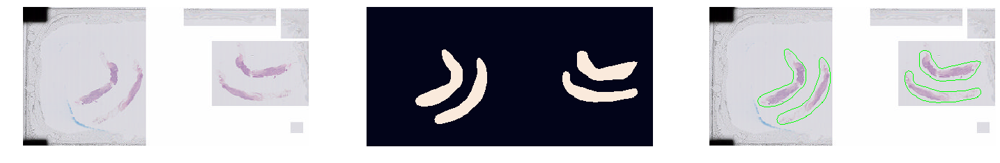

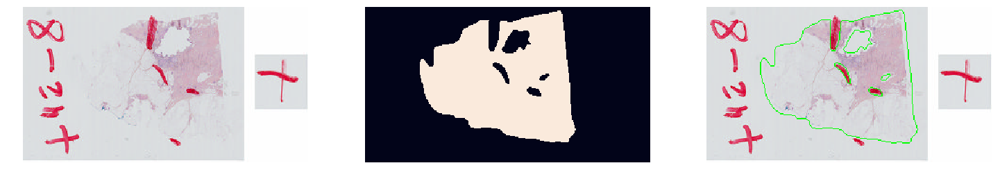

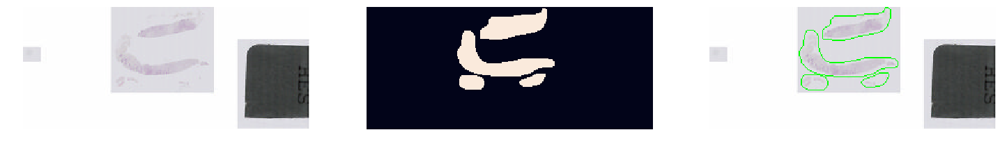

In [2]:
PATH_Train = './Data/Data_TissueSegmentation/Annotations/*.nii.gz'
PATH_Test = './Data/Data_TissueSegmentation/AnnotationsTest/*.nii.gz'

annotations = glob(PATH_Train)
annotations_test = glob(PATH_Test)


print('We have {} images in the training set.'.format(len(annotations)))
print('We have {} images in the test set.'.format(len(annotations_test)))

# RAW data
for i in range(5):
    plot_annotation(choice(annotations))

## Necessary data generators and tensorflow files

In [3]:
tmp = './tmp'
CheckOrCreate(tmp)

MeanFile = "./tmp/mean_file.npy"
TrainRec = "./tmp/train.tfrecord"
TestRec = "./tmp/test.tfrecord"

DG_Train = TissueGenerator(PATH_Train)
DG_Test  = TissueGenerator(PATH_Test, train=False)

mean_array = compute_mean(MeanFile, [DG_Train, DG_Test])
create_tfrecord(TrainRec, [DG_Train])
create_tfrecord(TestRec, [DG_Test])

TrainRec_unet = "./tmp/train_unet.tfrecord"
TestRec_unet = "./tmp/test_unet.tfrecord"

DG_Train_unet = TissueGeneratorUnet(PATH_Train)
DG_Test_unet  = TissueGeneratorUnet(PATH_Test, train=False)

create_tfrecord(TrainRec_unet, [DG_Train_unet])
create_tfrecord(TestRec_unet, [DG_Test_unet])

val_rgb, val_lbl = prep_val([DG_Test], unet=False)
val_rgb_unet, val_lbl_unet = prep_val([DG_Test_unet], unet=True)

n = 2
test_set = []
for name, rgb in RandomImagePick(n_copies=n):
    test_set.append((name, rgb))
    
results_training = {}
table_models = {}
best_models = {}

## Model hyper-parameters

In [4]:
tri_lr = [0.01, 0.001, 0.0001]
bi_wd = [5e-5, 5e-6]
bi_loss = [("l1", l1_loss), ("l2", l2_loss)]
tri_arch = [4, 16, 32]
tri_bn = [4, 8, 16]

variables_mod = {
    'num_channels' : 3, # because it is rgb
    'num_labels' : 2, # because we have two classes: object, background
    'tensorboard' : True, # to not keep results in a tensorboard
    'verbose' : 0, # to not print anything (0, 1, 2 levels)
    #displacement = 0 # because size(input) == size(output) #this variable is intented as padding correction
    }

variables_training = {
    ## training:
    'lr_procedure' : "10epoch", # the decay rate will be reduced every 5 epochs
    'batch_size' : 4, # batch size for the
    'decay_ema' : 0.9999, # 
    'k' : 0.96, # exponential decay factor
    'mean_array' : mean_array, #mean array of input images
    'n_epochs' : 60, # number of epochs
    'early_stopping' : 20, # when to stop training, 20 epochs of non progression
    'save_weights' : True, # if to store as final weight the best weights thanks to early stopping
    'num_parallele_batch' : 8, # number batch to run in parallel (number of cpu usually)
    'restore' : False, # allows the model to be restored at training phase (or re-initialized)
    'verbose' : 0
}

# PangNet

In any deep learning problem, many hyper-parameters are shared by the model such as:
- Number of channels for input (RGB is 3)
- Number of classes for label (usually 2 or greater)
- Tensorbard (bool) if to record the data while processing it. Useful to check input/outputs/graph.
- Verbose (bool) if to print the steps.
- displacement is useful for segmentation in neural nets, in case you use "VALID" padding, your input and output will different size. In particular size(input) = size(output) + 2 * displacement.

For the training procedure, we can divide parameter by group.

1. Input training and validation:
    - TrainRec, training record which will have the training inputs.
    - TestRec, validation/testing record which will have the same sized testing/validation images.
2. Learning rate and it's updates:
    - Learning rate, value to update the gradients by. Usually in range of 10e-4 ca be good. But this is the main parameter.
    - lr_procedure, this parameter controls when the learning rate will be multipliyed by decreasing exponential. For instance, by writting "1epoch" you will decrease the learning rate every epoch.
3. Loss and regularizer:

The loss is defined as: $$\mathcal{L} = \text{CrossEntropy}(f(X), y) + w \cdot \sum \text{loss}(w) $$  
    - Weight decay, is the scalar by which you multiply to the norm of the parameters you wish to regularize
    - Loss
4. Stopping criteria
    - n_epochs, number of epochs max.
    - Early stopping, number of epochs on which to check if the metrics have not increased, if it doesn't increase for n epochs well the model will stop.
5. Other important parameters
    - Batch size
    - Archictecture (you would have to modify the instance init_architecture in the segmentation_net object)
    - Data augmentations (not yet parametrisable)

## Train 
During training we cross validate the model on the learning rate and on the weight decay.


Training... this may take a while
INFO:tensorflow:Restoring parameters from ./tmp/PangNet__0.01__5e-05__l1/model.ckpt-15
INFO:tensorflow:Restoring parameters from ./tmp/PangNet__0.01__5e-05__l2/model.ckpt-0
INFO:tensorflow:Restoring parameters from ./tmp/PangNet__0.01__5e-06__l1/model.ckpt-19
INFO:tensorflow:Restoring parameters from ./tmp/PangNet__0.01__5e-06__l2/model.ckpt-0
INFO:tensorflow:Restoring parameters from ./tmp/PangNet__0.001__5e-05__l1/model.ckpt-1
INFO:tensorflow:Restoring parameters from ./tmp/PangNet__0.001__5e-05__l2/model.ckpt-55
INFO:tensorflow:Restoring parameters from ./tmp/PangNet__0.001__5e-06__l1/model.ckpt-48
INFO:tensorflow:Restoring parameters from ./tmp/PangNet__0.001__5e-06__l2/model.ckpt-0
INFO:tensorflow:Restoring parameters from ./tmp/PangNet__0.0001__5e-05__l1/model.ckpt-12
INFO:tensorflow:Restoring parameters from ./tmp/PangNet__0.0001__5e-05__l2/model.ckpt-56
INFO:tensorflow:Restoring parameters from ./tmp/PangNet__0.0001__5e-06__l1/model.ckpt-57
INF

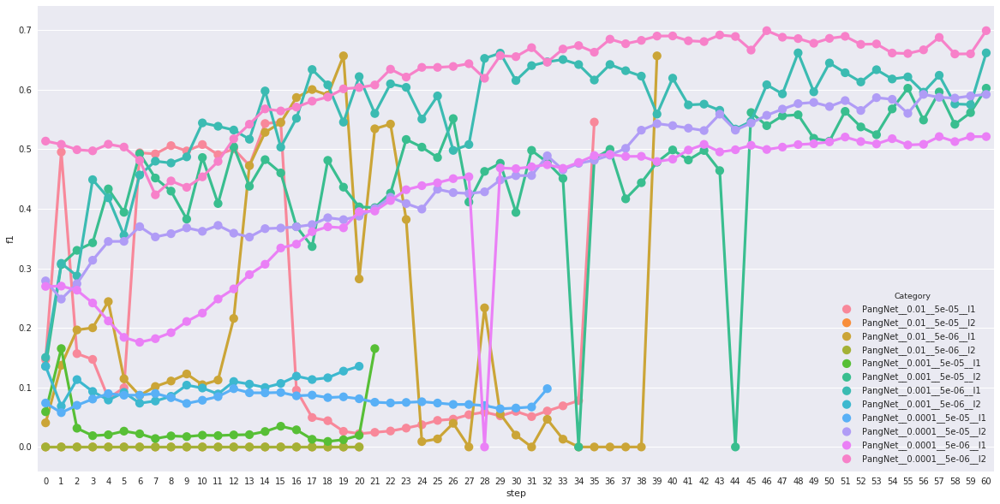

best model is: PangNet__0.0001__5e-06__l2


f1  step
Model   Learning rate Weight decay Loss                
PangNet 0.0001        5e-05        l1    0.097908    32
                                   l2    0.591927    60
                      5e-06        l1    0.521088    60
                                   l2    0.698943    60
        0.001         5e-05        l1    0.165156    21
                                   l2    0.602312    60
                      5e-06        l1    0.661654    60
                                   l2    0.135504    20
        0.01          5e-05        l1    0.545432    35
                                   l2    0.000000    20
                      5e-06        l1    0.656629    39
                                   l2    0.000000    20

In [5]:
print("Training... this may take a while")
for lr in tri_lr:
    for wd  in bi_wd:
        for name, loss in bi_loss:
            log = os.path.join(tmp, 'PangNet__{}__{}__{}').format(lr, wd, name)
            model = SegmentationNet(image_size=(224, 224), log=log, **variables_mod)
            dic = model.train(TrainRec, TestRec, learning_rate=lr, weight_decay=wd, 
                              loss_func=loss, **variables_training)
            results_training[os.path.basename(log)] = dic
            model.sess.close()
print("Training finished.")

print("Plotting test curves for PangNet")
tmp_pang = plot_curves("PangNet", results_training, keep=None)
tab, name = recap_tab(tmp_pang, "PangNet")
table_models["PangNet"] = tab
best_models["PangNet"] = name
table_models["PangNet"]

## Validation
We can also have a look at it's performance on the validation set.

INFO:tensorflow:Restoring parameters from ./tmp/PangNet__0.0001__5e-06__l2/model.ckpt-60


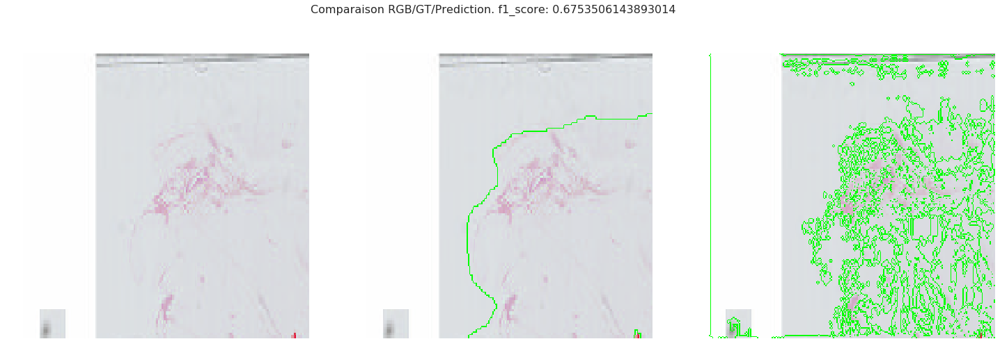

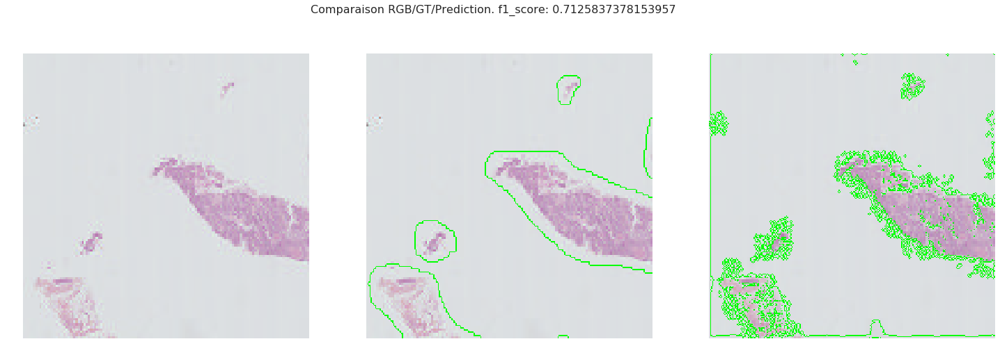

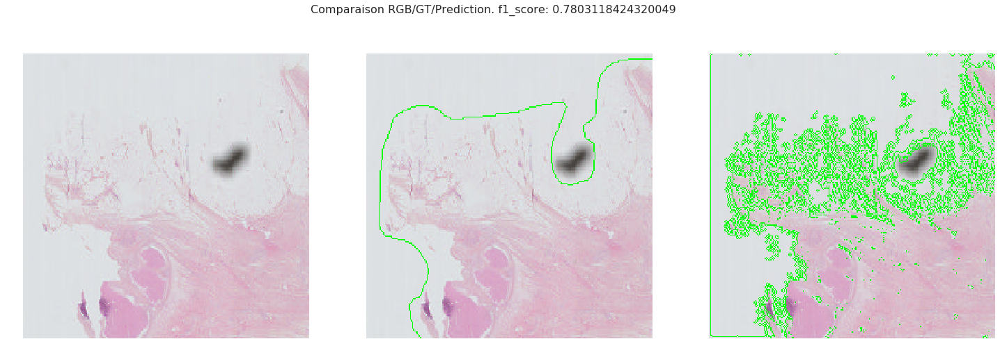

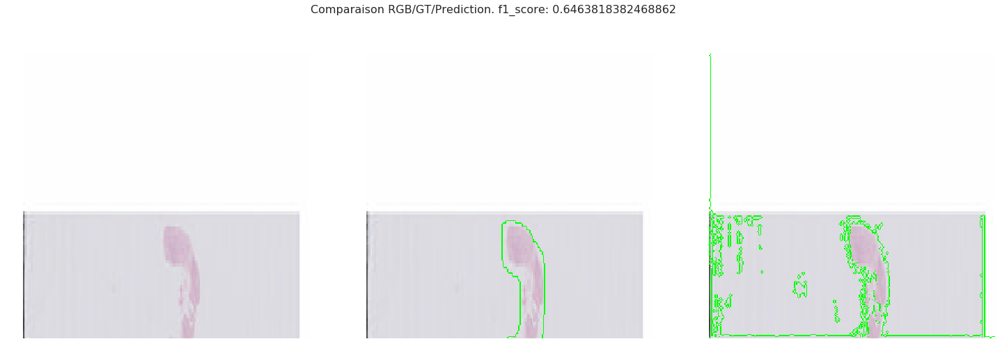

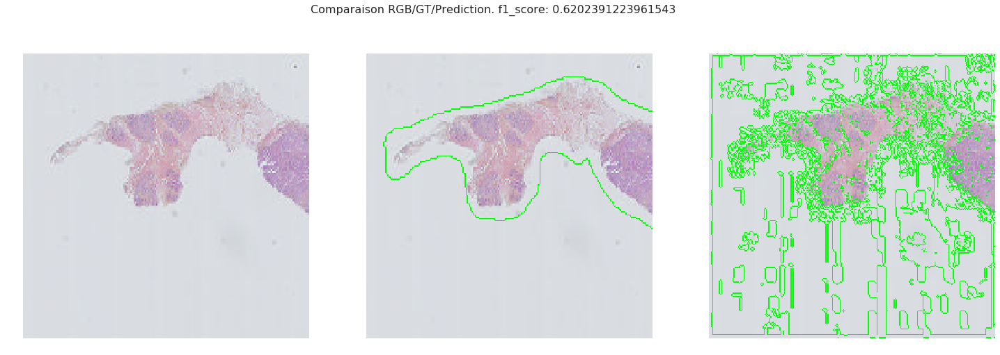

...

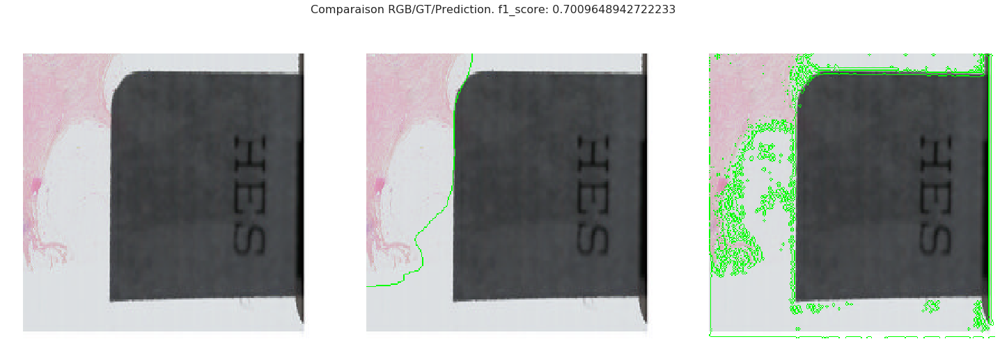

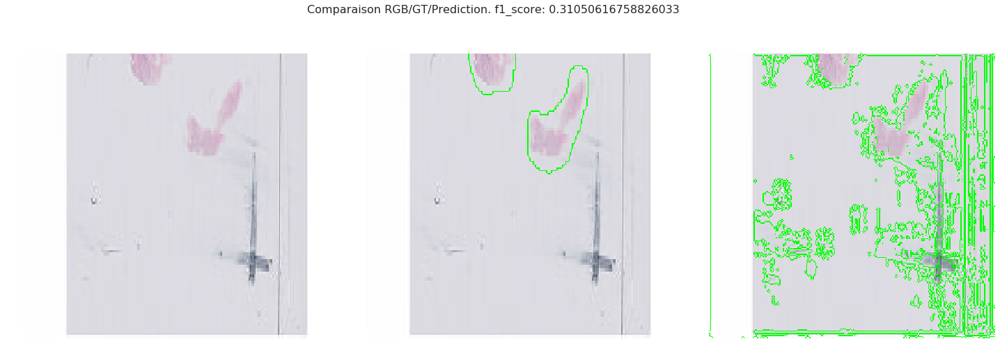

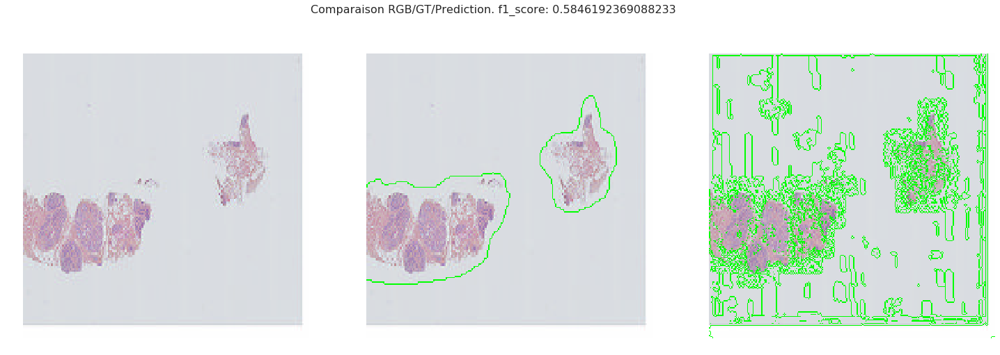

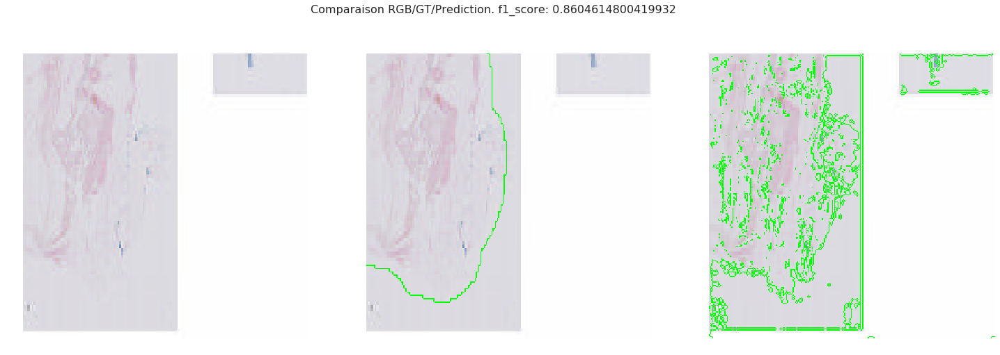

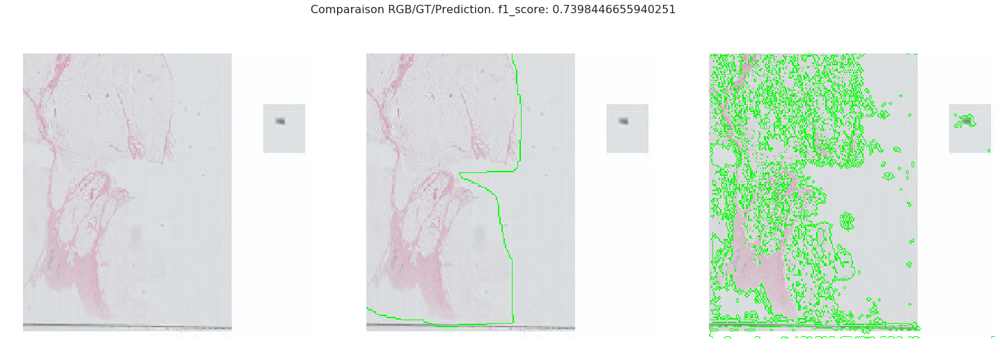

In [6]:
log = os.path.join(tmp, best_models["PangNet"])
model = SegmentationNet(image_size=(224, 224), log=log, **variables_mod)
validation_result = model.predict_list(val_rgb, label=val_lbl, mean=mean_array)
plot_validation(validation_result, val_rgb, val_lbl, unet=False)

## Test
We can apply our model and check it visualy on new images.

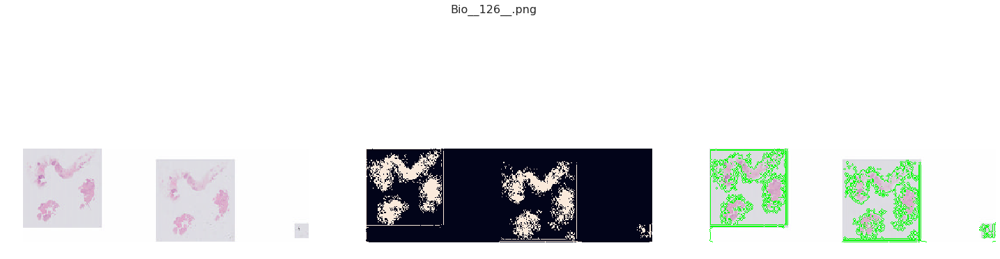

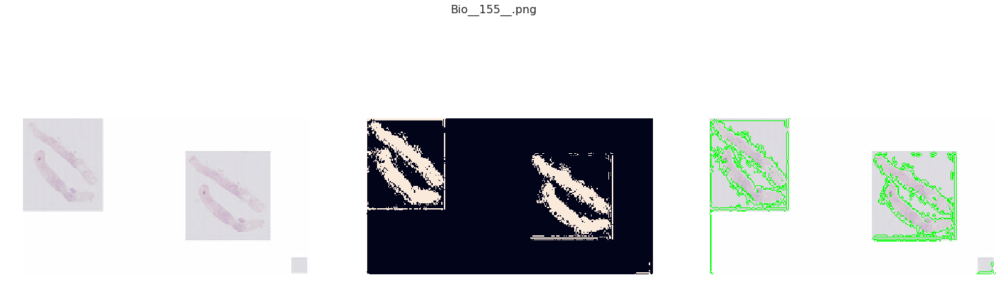

In [7]:
for name, rgb in test_set:
    mask = model.predict(rgb, mean=mean_array)['predictions'].astype('uint8')
    plot_overlay(rgb, mask, title=os.path.basename(name))

We notice that in this case, the model seems to pick up the change of background with some noisy signal. We can clean the prediction with some easy mathematical morphology operations.

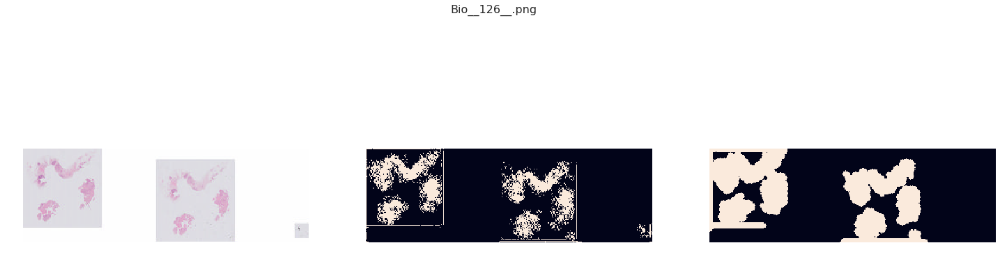

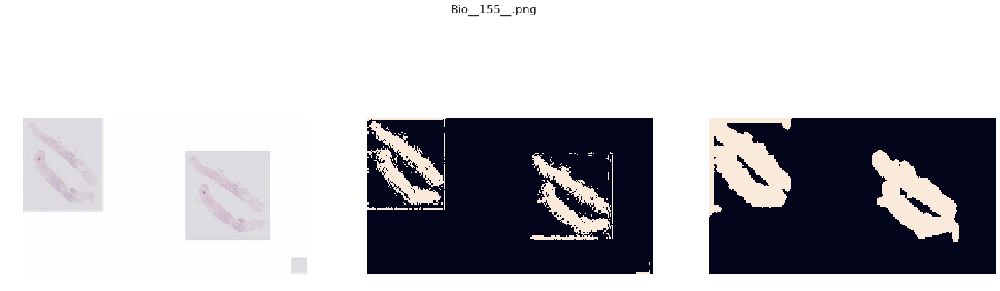

In [8]:
def CleanPrediction(m, thresh=100, disk_size=3):
    img = meas.label(m.copy())
    img = remove_small_objects(img, min_size=thresh)
    img = remove_small_holes(img, thresh)
    ## just to take a bigger margin around the images
    img = binary_dilation(img, disk(disk_size))
    return img

for name, rgb in test_set:
    mask = model.predict(rgb, mean=mean_array)['predictions'].astype('uint8')
    cleaned_mask = CleanPrediction(mask)
    plot_triplet(rgb, mask, cleaned_mask, title=os.path.basename(name))

# U-net
## Train u-net
New hyper parameter: N_FEATURES, controls the number of feature maps in the first layer, afterwards the number of features maps of the other layers are proportionnal. In the original paper, n_feature is set to 64.
![UNet](img/UNet.png)

Training... this may take a while
INFO:tensorflow:Restoring parameters from ./tmp/Unet__0.01__4/model.ckpt-0
INFO:tensorflow:Restoring parameters from ./tmp/Unet__0.01__16/model.ckpt-0
INFO:tensorflow:Restoring parameters from ./tmp/Unet__0.01__32/model.ckpt-0
INFO:tensorflow:Restoring parameters from ./tmp/Unet__0.001__4/model.ckpt-0
INFO:tensorflow:Restoring parameters from ./tmp/Unet__0.001__16/model.ckpt-0
INFO:tensorflow:Restoring parameters from ./tmp/Unet__0.001__32/model.ckpt-0
INFO:tensorflow:Restoring parameters from ./tmp/Unet__0.0001__4/model.ckpt-7
INFO:tensorflow:Restoring parameters from ./tmp/Unet__0.0001__16/model.ckpt-0
INFO:tensorflow:Restoring parameters from ./tmp/Unet__0.0001__32/model.ckpt-33
Training finished.
Plotting test curves for Unet


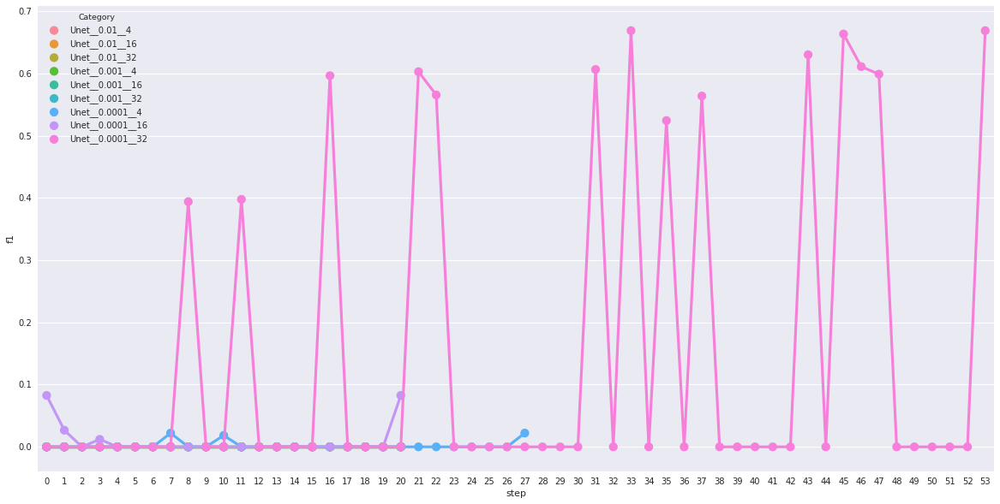

best model is: Unet__0.0001__32


f1  step
Model Learning rate N_features                
Unet  0.0001        16          0.082630    20
                    32          0.668936    53
                    4           0.022139    27
      0.001         16          0.000000    20
                    32          0.000000    20
                    4           0.000000    20
      0.01          16          0.000000    20
                    32          0.000000    20
                    4           0.000000    20

In [9]:
wd = 0.0005
loss = l2_loss
variables_training['loss_func'] = loss
variables_training['weight_decay'] = wd

print("Training... this may take a while")
for lr in tri_lr:
    for arch in tri_arch:
        log = os.path.join(tmp, 'Unet__{}__{}'.format(lr, arch))
        model = Unet(image_size=(256, 256), log=log, n_features=arch, **variables_mod)
        dic = model.train(TrainRec, TestRec, learning_rate=lr, **variables_training)
        results_training[os.path.basename(log)] = dic
        model.sess.close()
print("Training finished.")
        
print("Plotting test curves for Unet")
tmp_unet = plot_curves("Unet", results_training, keep=None)
tab, name = recap_tab(tmp_unet, "Unet")
table_models["Unet"] = tab
best_models["Unet"] = name
table_models["Unet"]

## Validation u-net

INFO:tensorflow:Restoring parameters from ./tmp/Unet__0.0001__32/model.ckpt-53


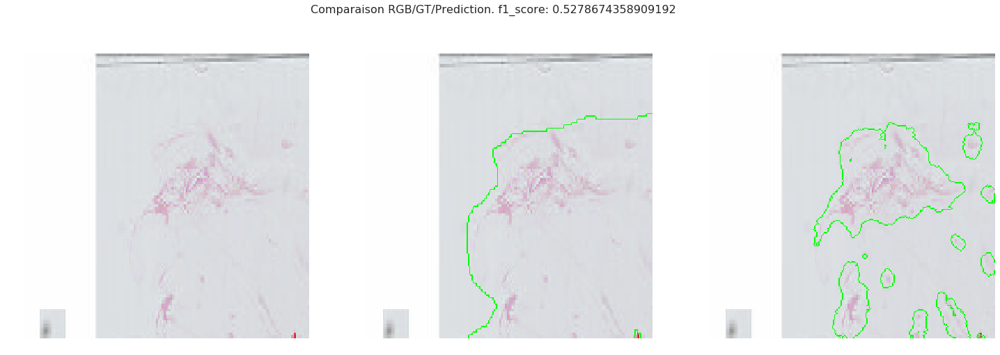

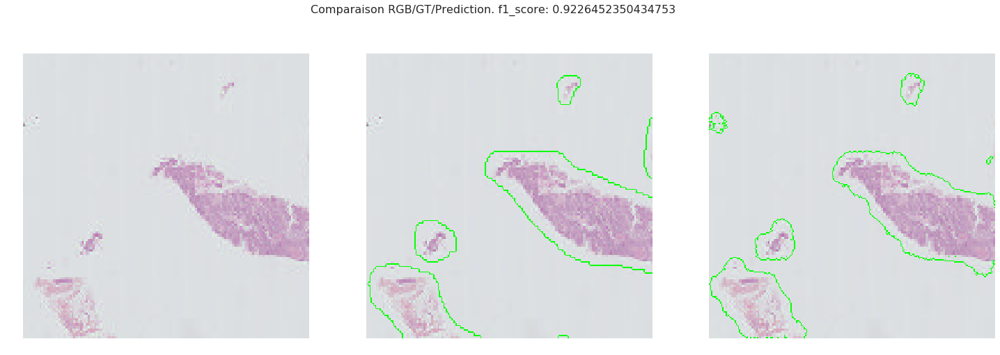

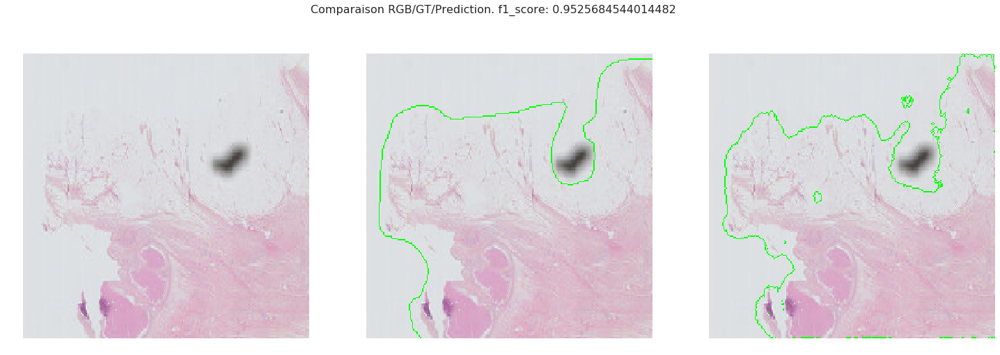

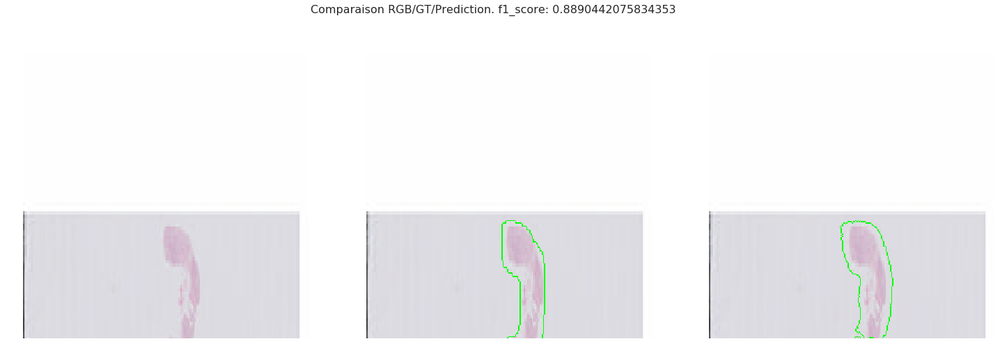

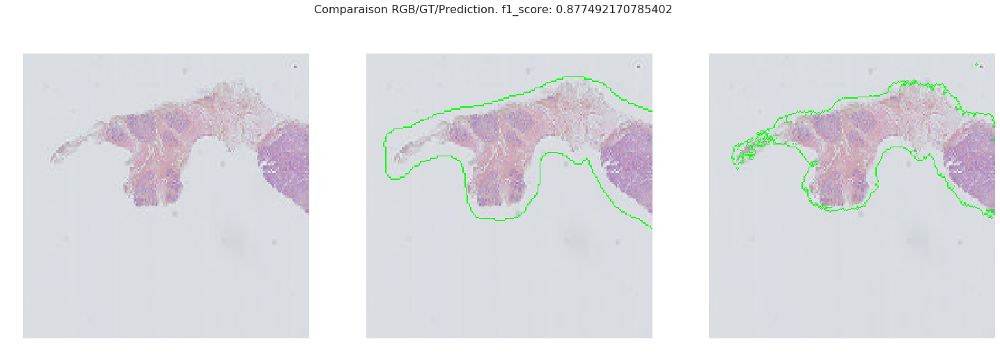

...

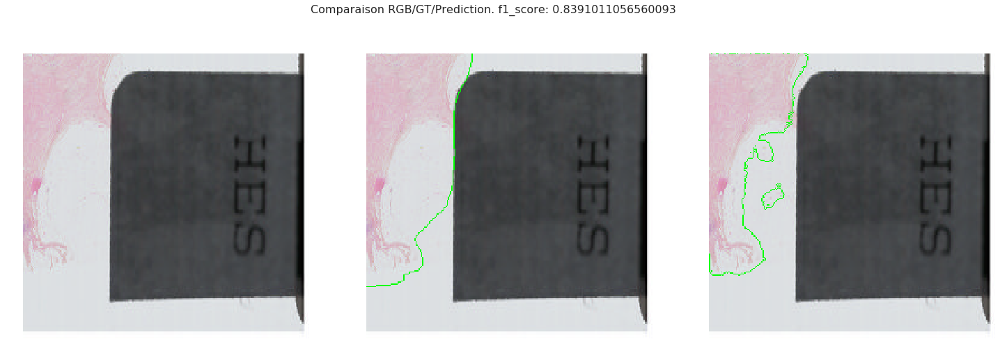

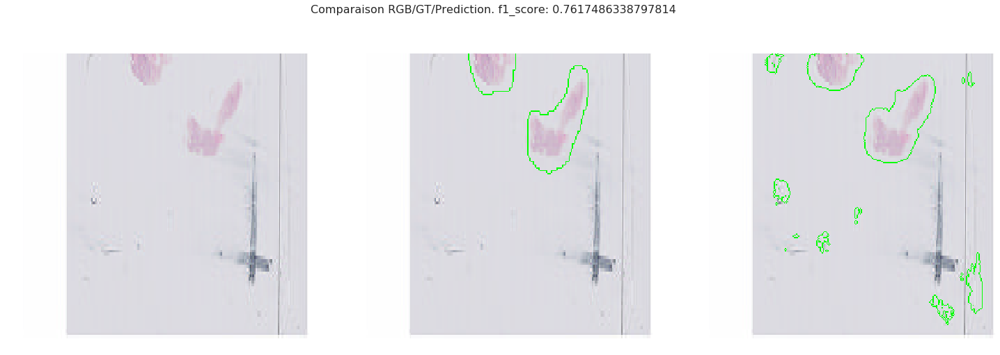

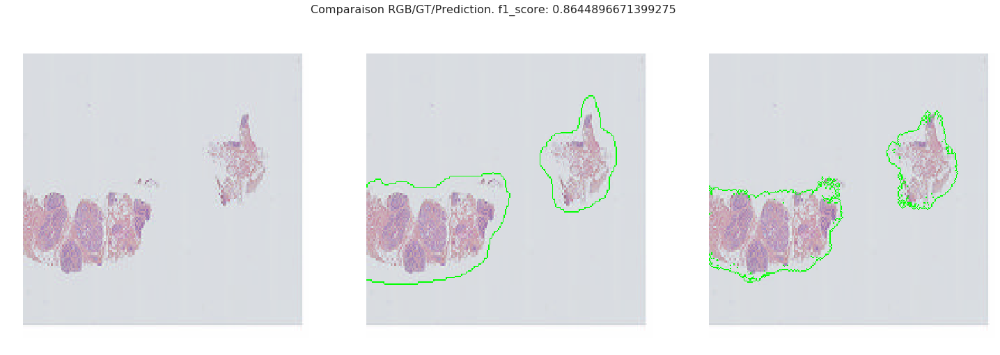

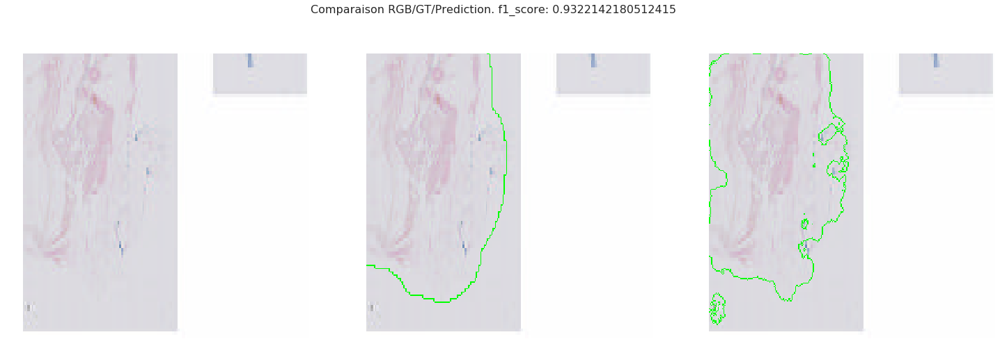

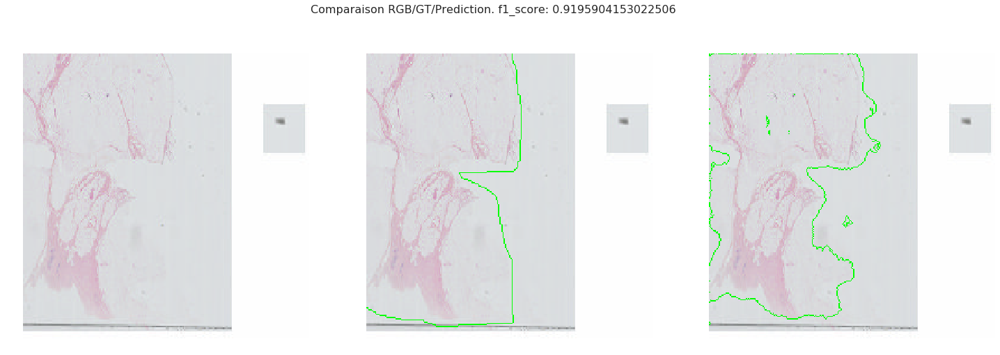

In [10]:
log = os.path.join(tmp, best_models["Unet"])
n_feat = int(log.split('__')[-1])
model = Unet(image_size=(256, 256), log=log, n_features=n_feat,  **variables_mod)
validation_result = model.predict_list(val_rgb, label=val_lbl, mean=mean_array)
plot_validation(validation_result, val_rgb, val_lbl, unet=False)

## Test u-net
We need some extra lines has the images has to be divisable by 2^4. If this is not the case, it leads to shift in resulting size.

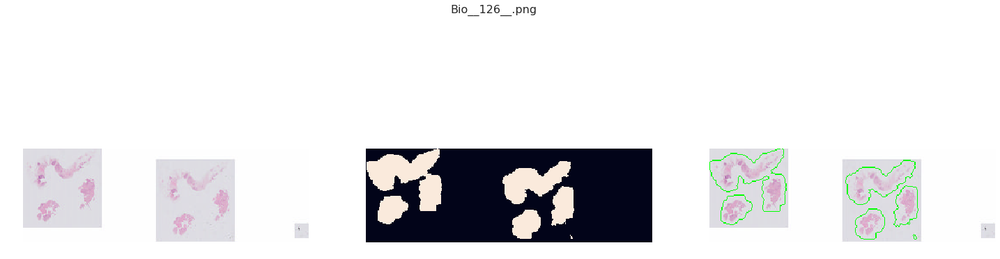

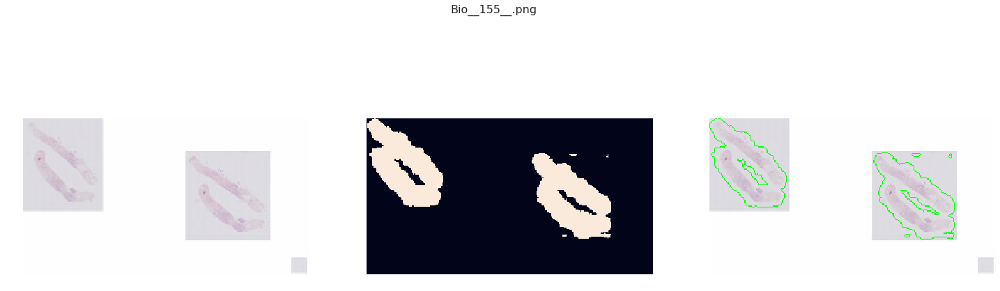

In [11]:
for name, rgb in test_set:
    orig = rgb.copy()
    orig_shape = rgb.shape[0:2]
    rgb = resize(rgb, (512, 512), order=0, 
                 preserve_range=True, mode='reflect', 
                 anti_aliasing=True).astype(rgb.dtype)
    mask = model.predict(rgb, mean=mean_array)['predictions'].astype('uint8')
    mask[mask > 0] = 255
    mask = img_as_bool(resize(mask, orig_shape, order=0, 
                  preserve_range=True, mode='reflect', 
                  anti_aliasing=True))
    plot_overlay(orig, mask, title=os.path.basename(name))

With the cleaning operation:

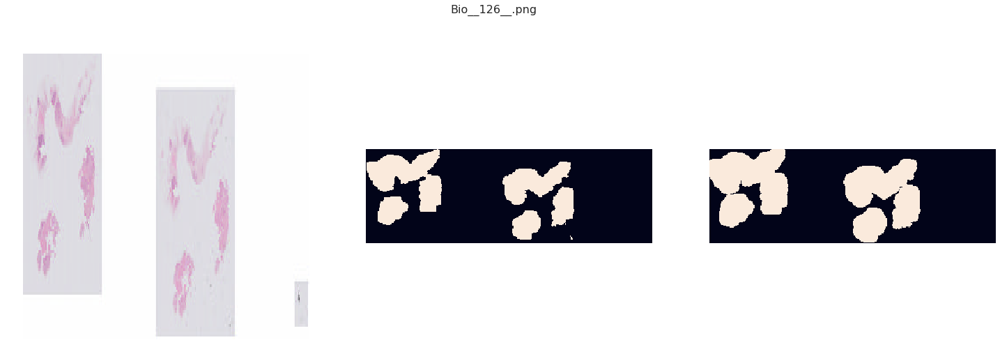

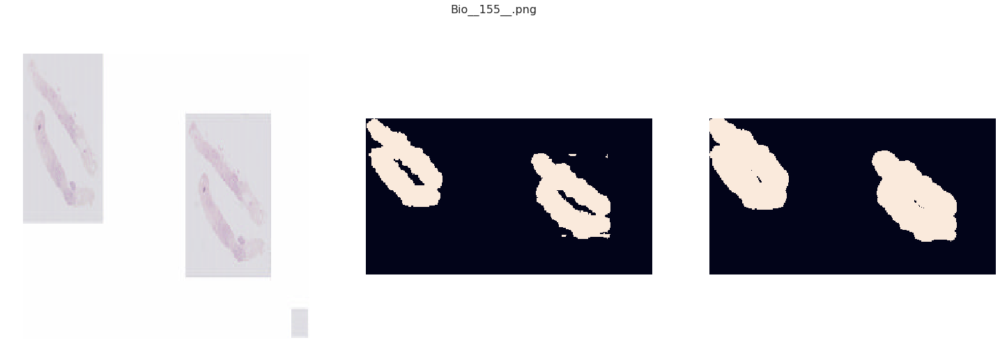

In [12]:
for name, rgb in test_set:
    orig = rgb.copy()
    orig_shape = rgb.shape[0:2]
    rgb = resize(rgb, (512, 512), order=0, 
                 preserve_range=True, mode='reflect', 
                 anti_aliasing=True).astype(rgb.dtype)
    mask = model.predict(rgb, mean=mean_array)['predictions'].astype('uint8')
    mask[mask > 0] = 255
    mask = img_as_bool(resize(mask, orig_shape, order=0, 
                  preserve_range=True, mode='reflect', 
                  anti_aliasing=True))
    cleaned_mask = CleanPrediction(mask)
    plot_triplet(rgb, mask, cleaned_mask, title=os.path.basename(name))

# U-net padded
In the first implementation of u-net, displacement is set to 0 has we perform convolutions with the same size input and output (for a given convolution). If we keep only the valid part of this convolution. The input image decrease of 92 pixel per side. Which is a side displacement of 92. We therefor create a different model that takes into account this displacement.
This model is meant to behave better on the borders then the u-net lacking this padding.
## Train u-net padded

Training... this may take a while
INFO:tensorflow:Restoring parameters from ./tmp/UnetPadded__0.01__4/model.ckpt-0
INFO:tensorflow:Restoring parameters from ./tmp/UnetPadded__0.01__16/model.ckpt-0
INFO:tensorflow:Restoring parameters from ./tmp/UnetPadded__0.01__32/model.ckpt-0
INFO:tensorflow:Restoring parameters from ./tmp/UnetPadded__0.001__4/model.ckpt-49
INFO:tensorflow:Restoring parameters from ./tmp/UnetPadded__0.001__16/model.ckpt-13
INFO:tensorflow:Restoring parameters from ./tmp/UnetPadded__0.001__32/model.ckpt-16
INFO:tensorflow:Restoring parameters from ./tmp/UnetPadded__0.0001__4/model.ckpt-1
INFO:tensorflow:Restoring parameters from ./tmp/UnetPadded__0.0001__16/model.ckpt-8
INFO:tensorflow:Restoring parameters from ./tmp/UnetPadded__0.0001__32/model.ckpt-20
Training finished.
Plotting test curves for UnetPadded


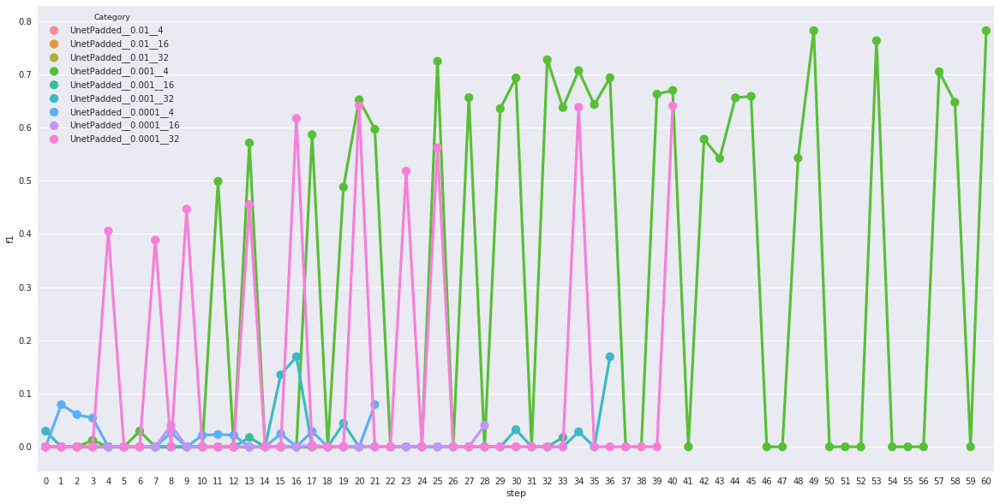

best model is: UnetPadded__0.001__4


f1  step
Model      Learning rate N_features                
UnetPadded 0.0001        16          0.040475    28
                         32          0.640845    40
                         4           0.079305    21
           0.001         16          0.017429    33
                         32          0.169290    36
                         4           0.782179    60
           0.01          16          0.000000    20
                         32          0.000000    20
                         4           0.000000    20

In [13]:
print("Training... this may take a while")
for lr in tri_lr:
    for arch in tri_arch:
        log = os.path.join(tmp, 'UnetPadded__{}__{}'.format(lr, arch))
        model = UnetPadded(image_size=(212, 212), log=log, n_features=arch, **variables_mod)
        dic = model.train(TrainRec_unet, TestRec_unet, learning_rate=lr, **variables_training)
        results_training[os.path.basename(log)] = dic
        model.sess.close()
print("Training finished.")
        
print("Plotting test curves for UnetPadded")
tmp_unetpadded = plot_curves("UnetPadded", results_training, keep=None)
tab, name = recap_tab(tmp_unetpadded, "UnetPadded")
table_models["UnetPadded"] = tab
best_models["UnetPadded"] = name
table_models["UnetPadded"]


# Validation u-net padded

INFO:tensorflow:Restoring parameters from ./tmp/UnetPadded__0.001__4/model.ckpt-60


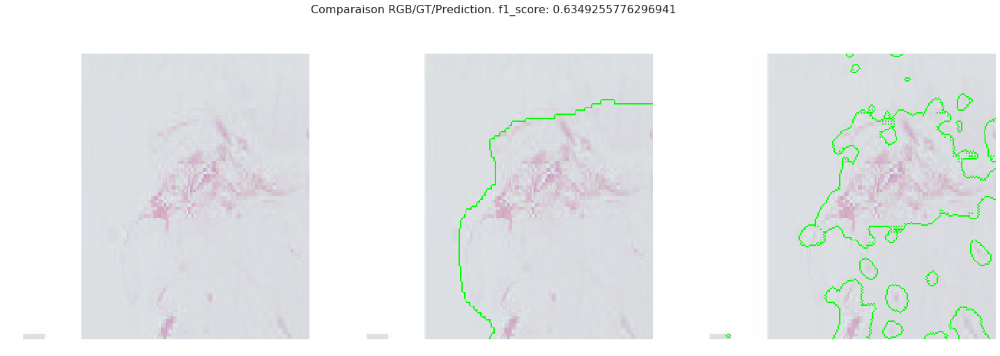

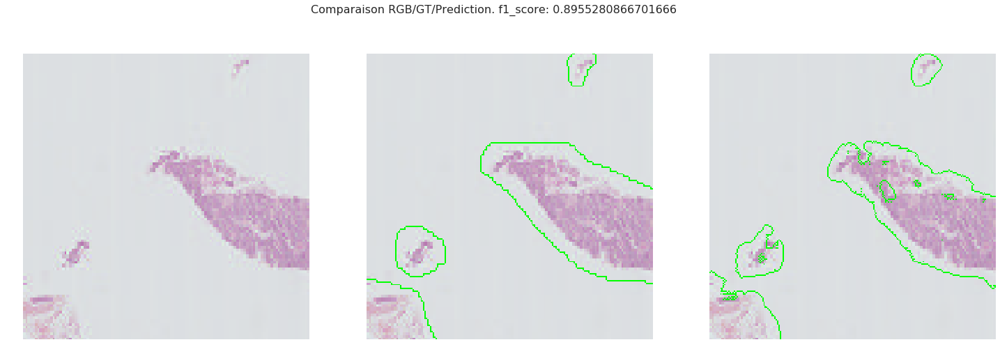

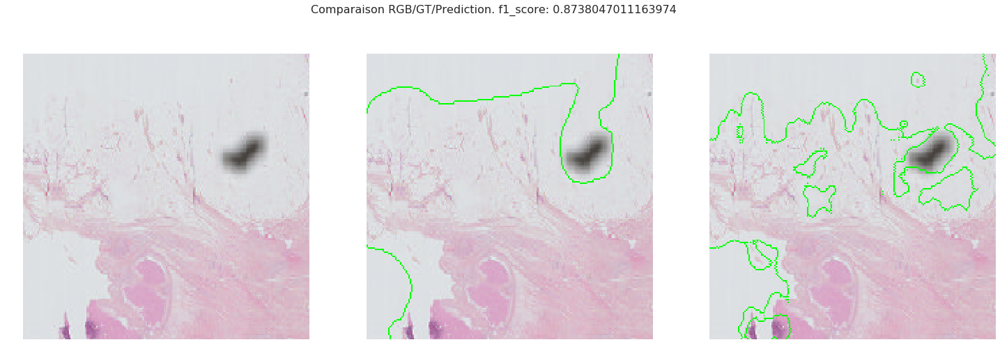

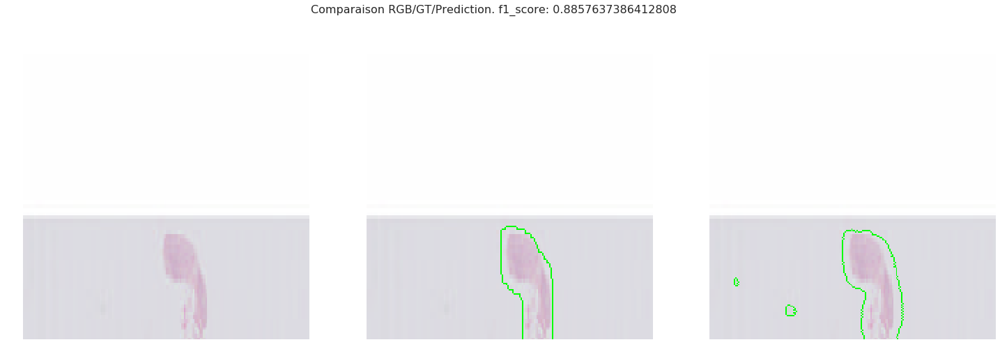

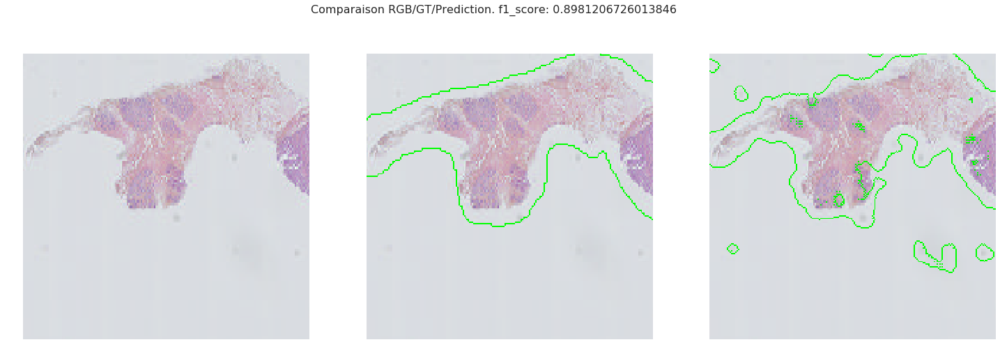

...

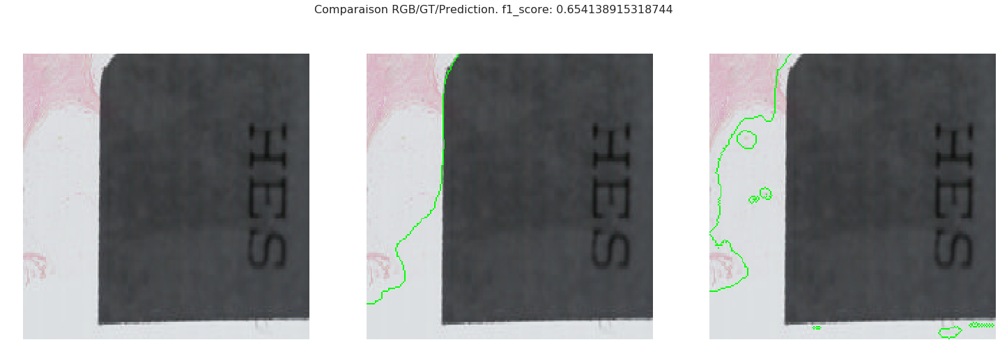

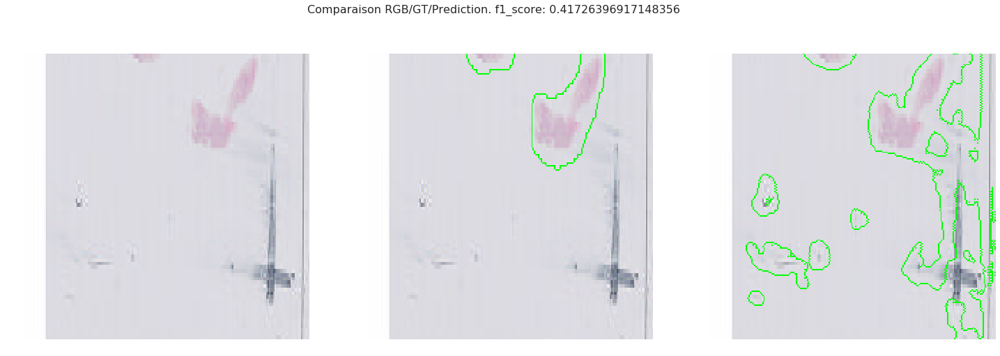

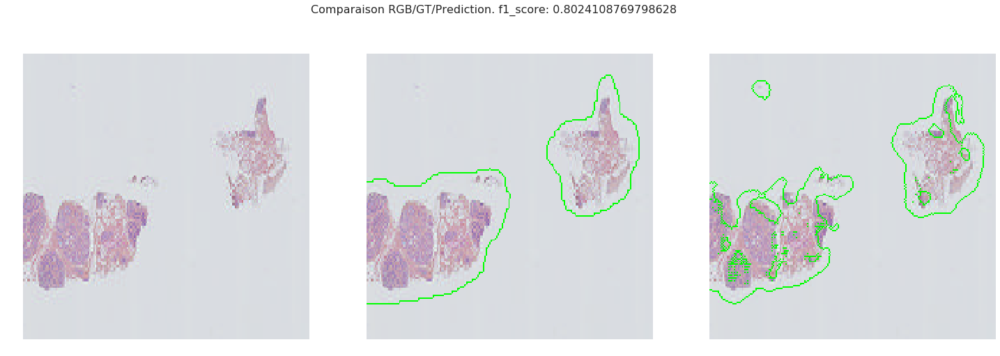

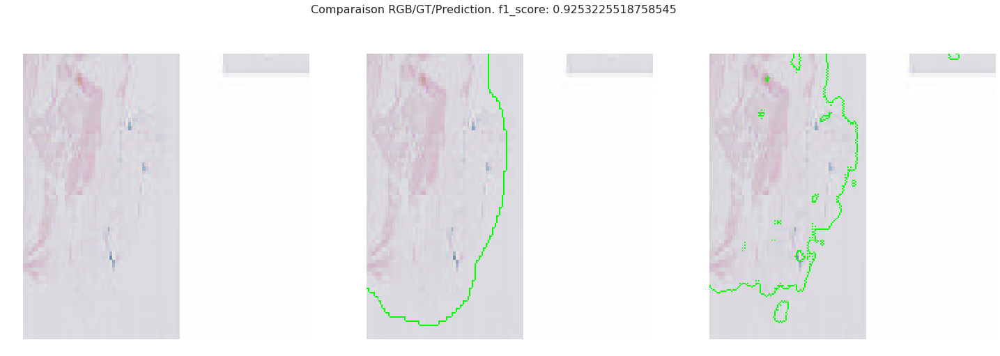

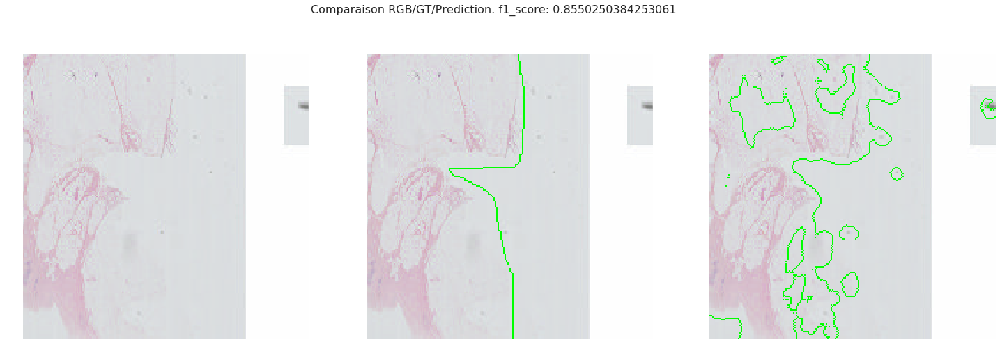

In [14]:
log = os.path.join(tmp, best_models["UnetPadded"])
n_feat = int(log.split('__')[-1])
model = UnetPadded(image_size=(212, 212), log=log, n_features=n_feat,  **variables_mod)
validation_result = model.predict_list(val_rgb_unet, label=val_lbl_unet, mean=mean_array)
plot_validation(validation_result, val_rgb_unet, val_lbl_unet, unet=True)

## Test u-net padded

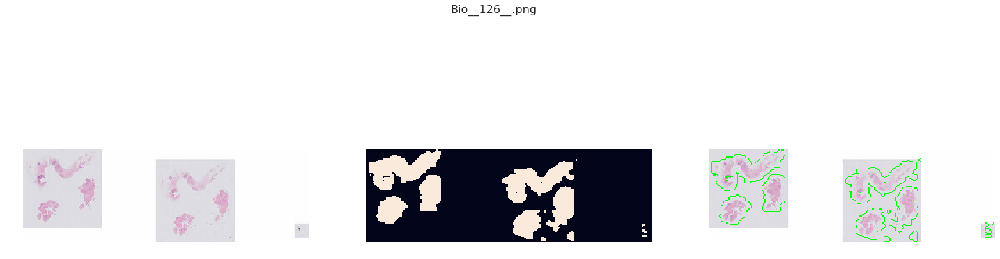

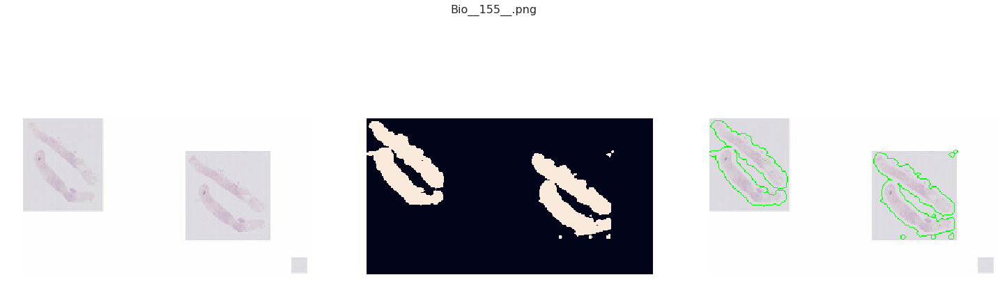

In [15]:
for name, rgb in test_set:
    mask = unet_pred(rgb, mean_array, model)['predictions'].astype('uint8')
    plot_overlay(rgb, mask, title=os.path.basename(name))

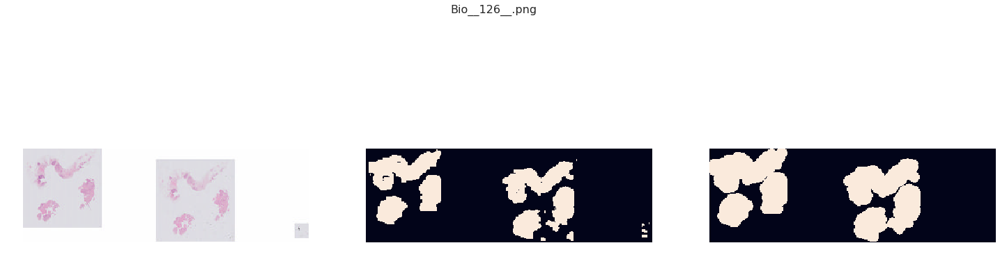

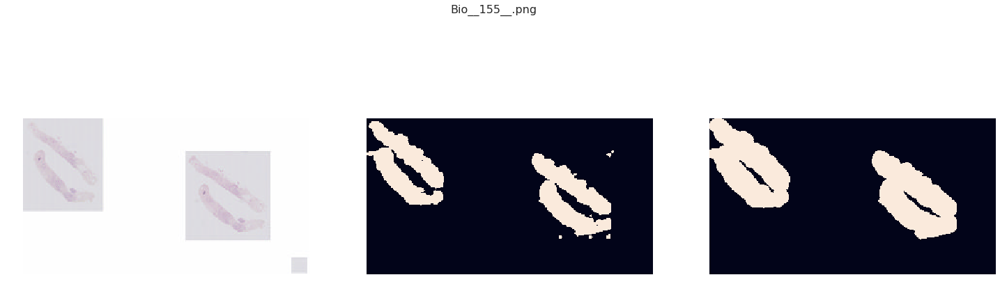

In [16]:
for name, rgb in test_set:
    mask = unet_pred(rgb, mean_array, model)['predictions'].astype('uint8')
    cleaned_mask = CleanPrediction(mask)
    plot_triplet(rgb, mask, cleaned_mask, title=os.path.basename(name))

# U-net and batch normalization

We will now insert a batch normalization layer inbetween the convolution output and the input to the non-linear activation function. This layer is meant to help smooth training and should be set according the problem. Usually one tries to maximise the space on a gpu but on smaller dataset beware to not make the batch size be equal to the set size.

## Train u-net bn

Training... this may take a while
INFO:tensorflow:Restoring parameters from ./tmp/BatchNormedUnet__0.01__4/model.ckpt-11
INFO:tensorflow:Restoring parameters from ./tmp/BatchNormedUnet__0.01__8/model.ckpt-5
INFO:tensorflow:Restoring parameters from ./tmp/BatchNormedUnet__0.01__16/model.ckpt-21
INFO:tensorflow:Restoring parameters from ./tmp/BatchNormedUnet__0.001__4/model.ckpt-3
INFO:tensorflow:Restoring parameters from ./tmp/BatchNormedUnet__0.001__8/model.ckpt-9
INFO:tensorflow:Restoring parameters from ./tmp/BatchNormedUnet__0.001__16/model.ckpt-12
INFO:tensorflow:Restoring parameters from ./tmp/BatchNormedUnet__0.0001__4/model.ckpt-8
INFO:tensorflow:Restoring parameters from ./tmp/BatchNormedUnet__0.0001__8/model.ckpt-22
INFO:tensorflow:Restoring parameters from ./tmp/BatchNormedUnet__0.0001__16/model.ckpt-24
Training finished.
Plotting test curves for BatchNormedUnet


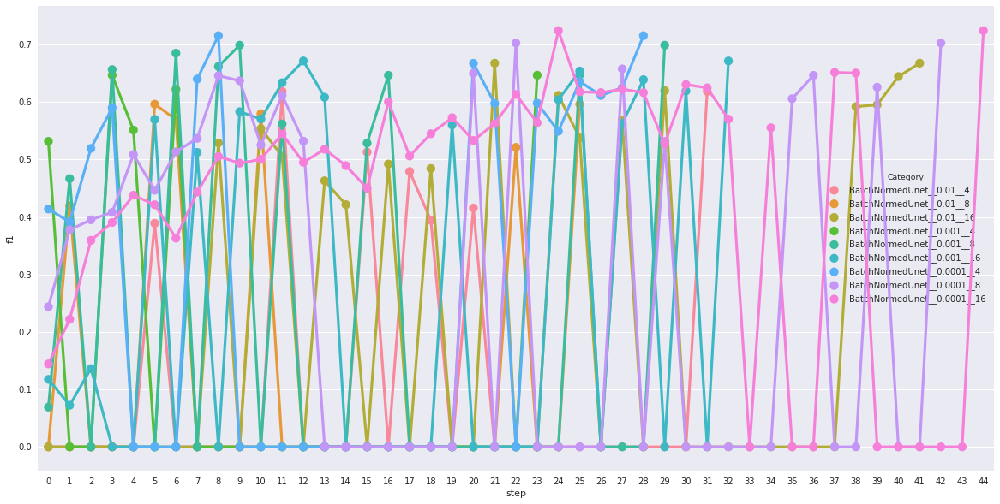

best model is: BatchNormedUnet__0.0001__16


f1  step
Model           Learning rate Batch Size                
BatchNormedUnet 0.0001        16          0.724199    44
                              4           0.715518    28
                              8           0.702661    42
                0.001         16          0.671450    32
                              4           0.646611    23
                              8           0.698871    29
                0.01          16          0.667548    41
                              4           0.618637    31
                              8           0.596284    25

In [17]:
del variables_training['batch_size']
variables_mod["n_features"] = 16

print("Training... this may take a while")
for lr in tri_lr:
    for bs in tri_bn:
        log = os.path.join(tmp, 'BatchNormedUnet__{}__{}'.format(lr, bs))
        model = BatchNormedUnet(image_size=(212, 212), log=log, **variables_mod)
        dic = model.train(TrainRec_unet, TestRec_unet, learning_rate=lr, batch_size=bs, **variables_training)
        results_training[os.path.basename(log)] = dic
        model.sess.close()
print("Training finished.")
        
print("Plotting test curves for BatchNormedUnet")
tmp_bunet = plot_curves("BatchNormedUnet", results_training, keep=None)
tab, name = recap_tab(tmp_bunet, "BatchNormedUnet")
table_models["BatchNormedUnet"] = tab
best_models["BatchNormedUnet"] = name
table_models["BatchNormedUnet"]

## Validation u-net bn

INFO:tensorflow:Restoring parameters from ./tmp/BatchNormedUnet__0.0001__16/model.ckpt-44


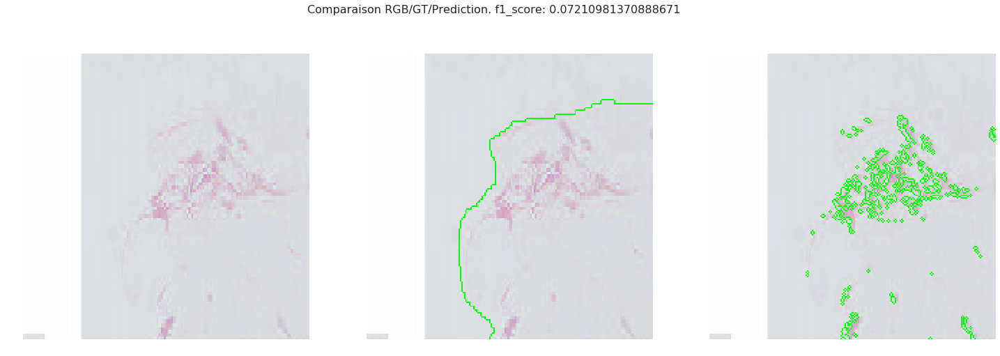

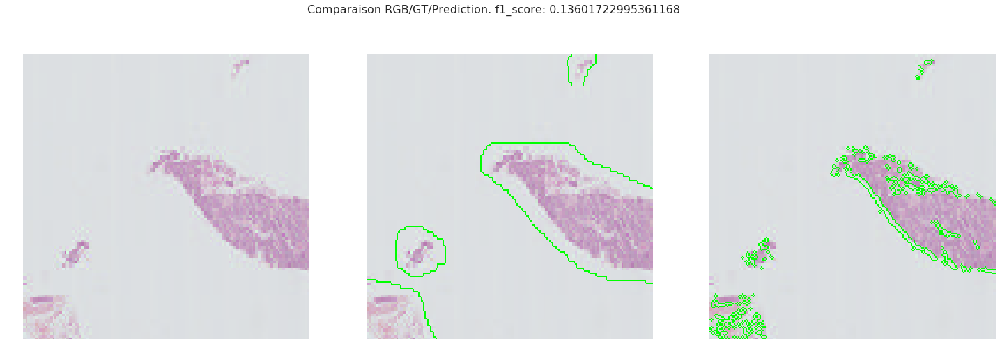

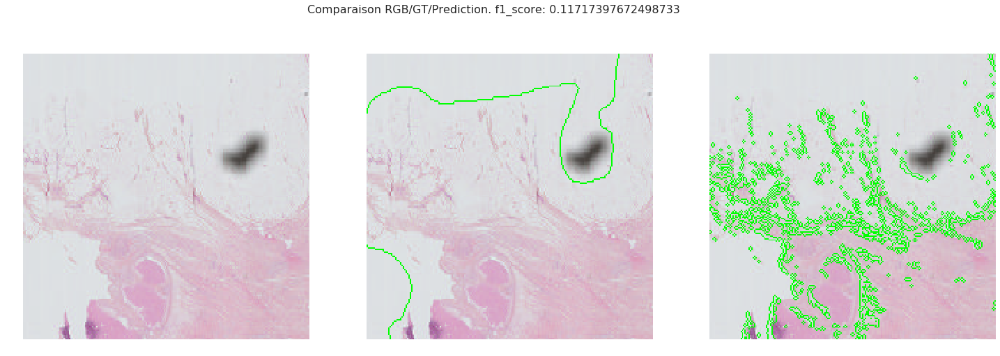

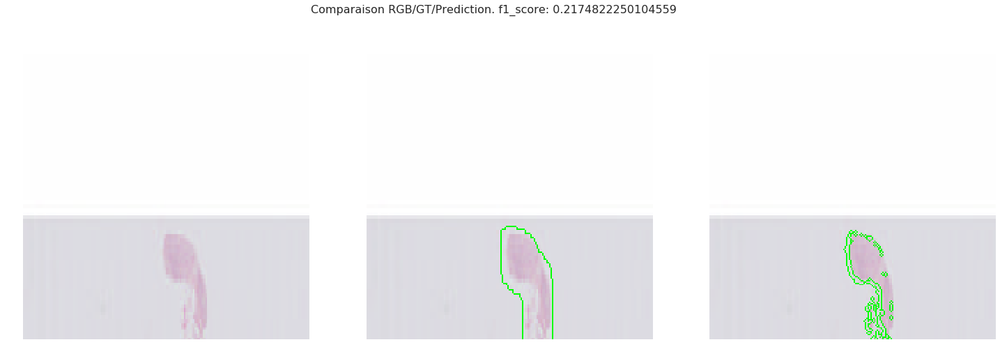

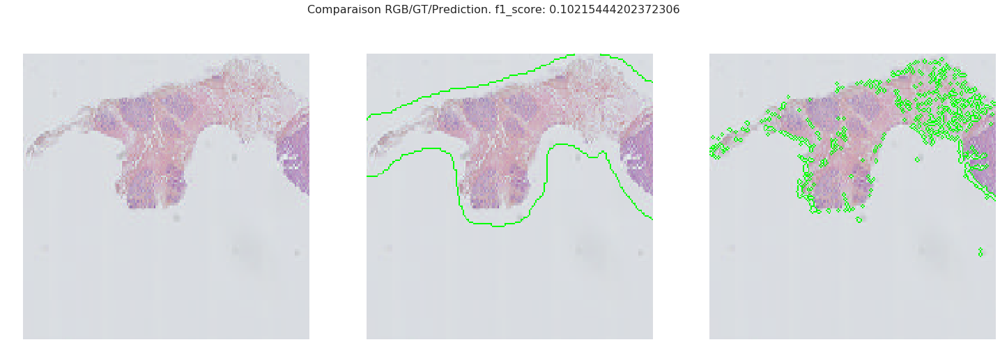

...

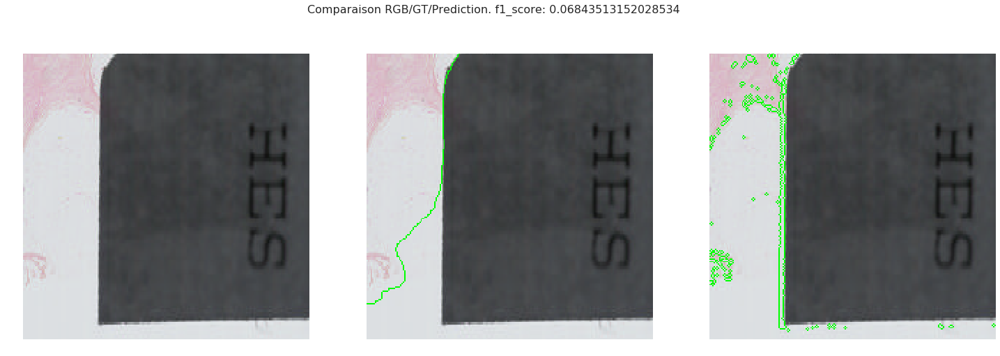

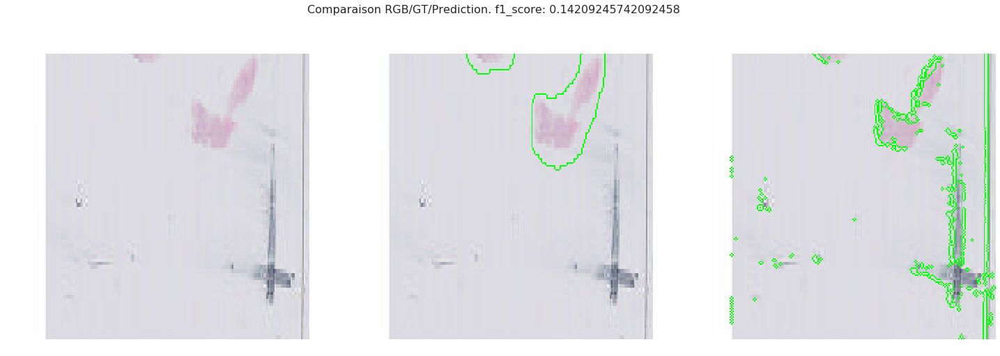

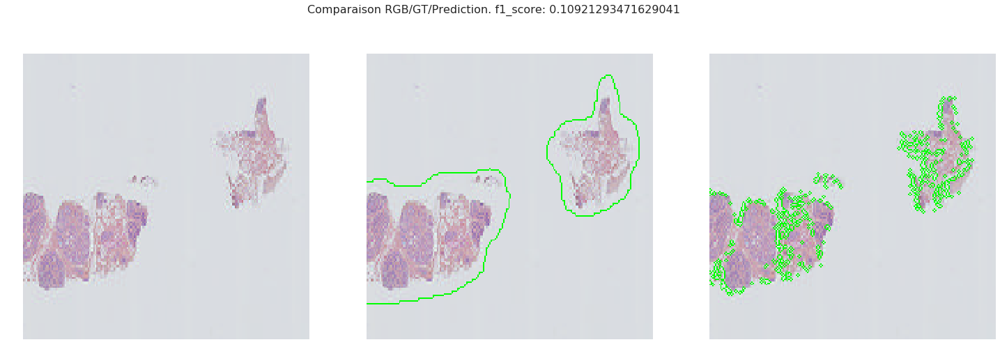

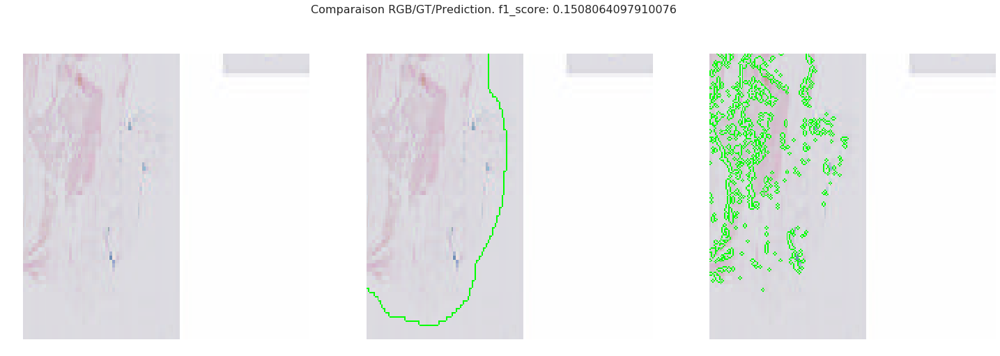

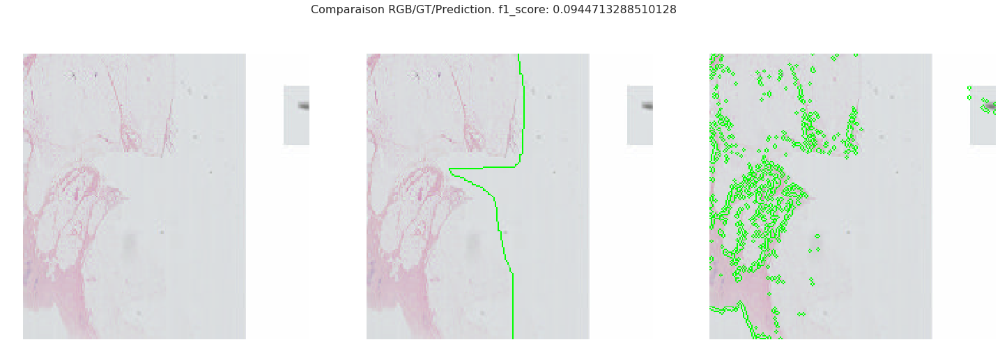

In [18]:
log = os.path.join(tmp, best_models["BatchNormedUnet"])
n_feat = int(log.split('__')[-1])
model = UnetPadded(image_size=(212, 212), log=log,  **variables_mod)
validation_result = model.predict_list(val_rgb_unet, label=val_lbl_unet, mean=mean_array)
plot_validation(validation_result, val_rgb_unet, val_lbl_unet, unet=True)

## Test u-net bn

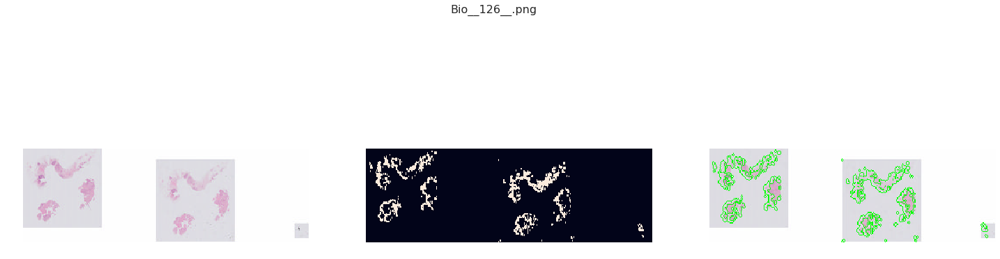

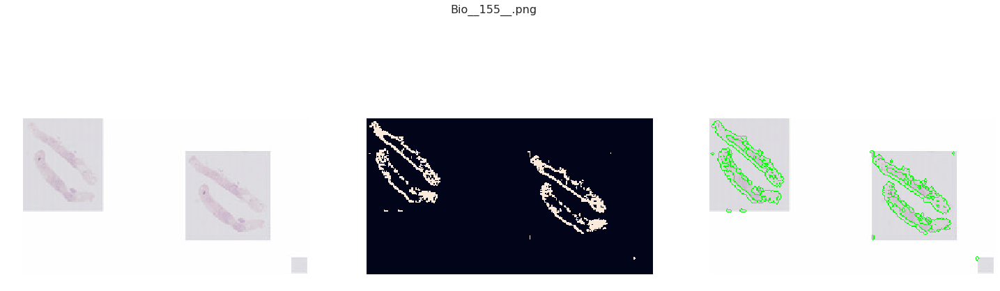

In [19]:
for name, rgb in test_set:
    mask = unet_pred(rgb, mean_array, model)['predictions'].astype('uint8')
    plot_overlay(rgb, mask, title=os.path.basename(name))

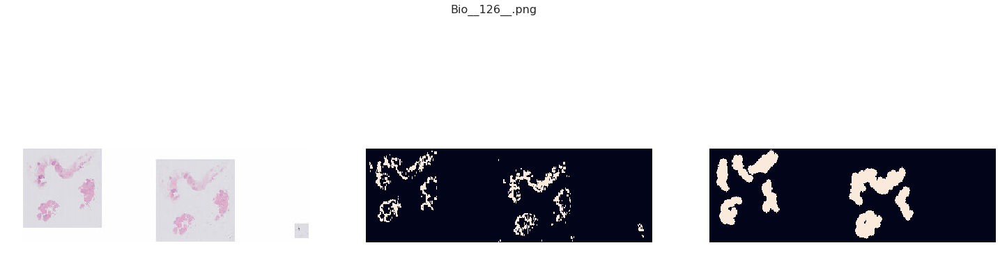

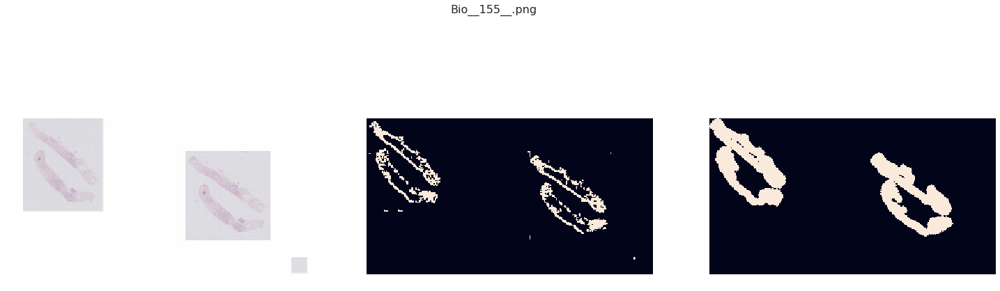

In [20]:
for name, rgb in test_set:
    mask = unet_pred(rgb, mean_array, model)['predictions'].astype('uint8')
    cleaned_mask = CleanPrediction(mask)
    plot_triplet(rgb, mask, cleaned_mask, title=os.path.basename(name))

# Comparing the models

## Metric comparaison

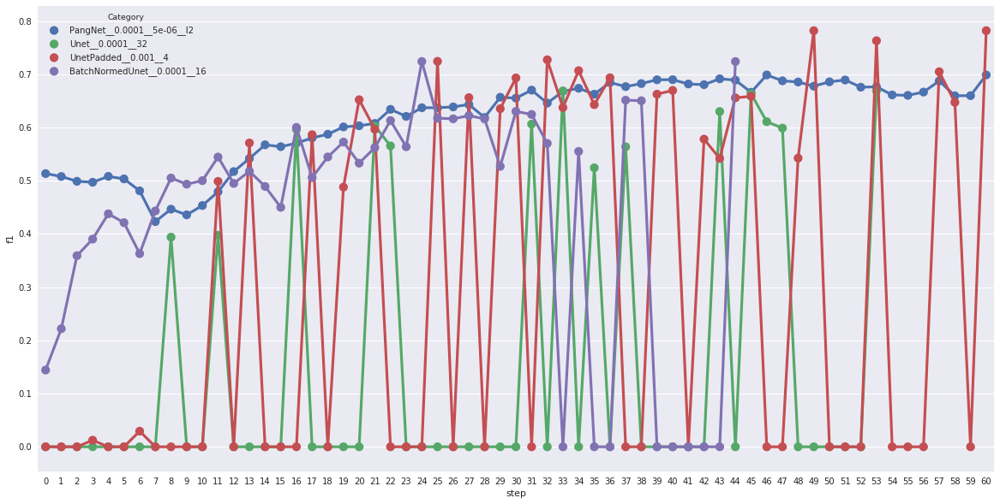

In [21]:
_ = plot_curves("", results_training, keep=best_models.values())

## Real image comparaison

INFO:tensorflow:Restoring parameters from tmp/PangNet__0.0001__5e-06__l2/model.ckpt-60
INFO:tensorflow:Restoring parameters from tmp/Unet__0.0001__32/model.ckpt-53
INFO:tensorflow:Restoring parameters from tmp/UnetPadded__0.001__4/model.ckpt-60
INFO:tensorflow:Restoring parameters from tmp/BatchNormedUnet__0.0001__16/model.ckpt-44


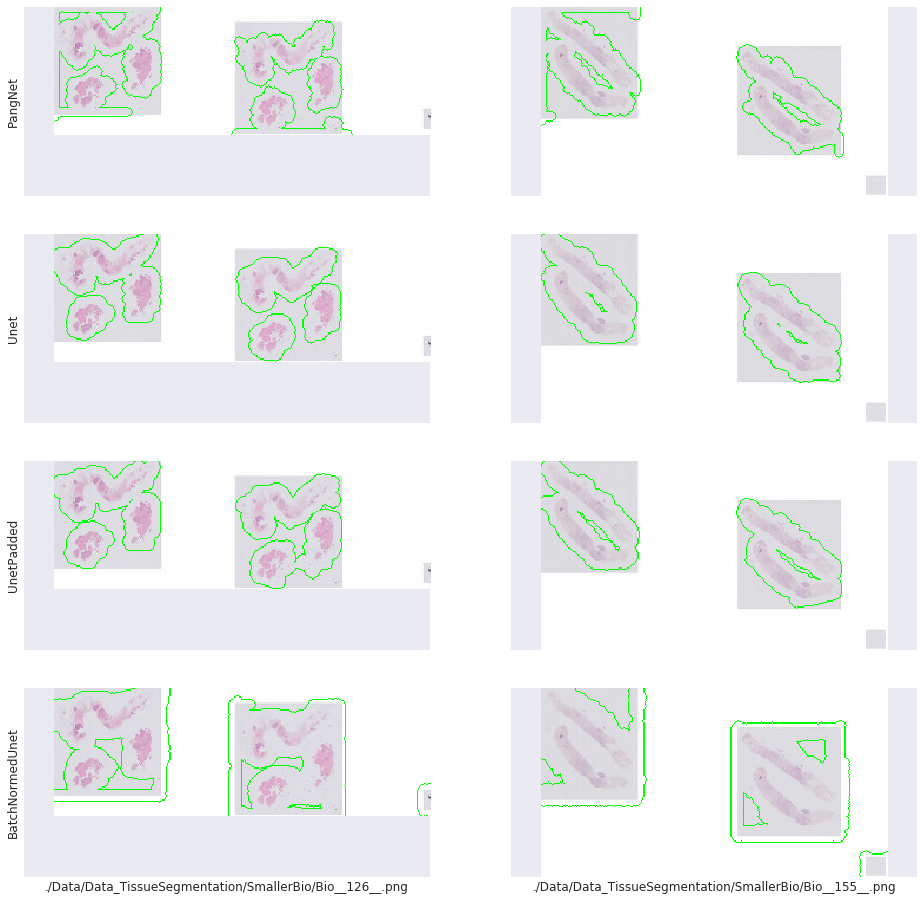

In [22]:
plot_quadoverlay(best_models, test_set, mean_array, n, aux_func=CleanPrediction)

# END